In [2]:
import pyproj

from functools import partial

import numpy as np

from skimage import filters, morphology
import matplotlib.pyplot as plt

In [3]:
# UTM zone and EPSG code calculator
zone_cal = round((183+4.322261810302735)/6,0)
EPSG = 32700-round((45+52.13475246108585)/90,0)*100+round((183+4.322261810302735)/6,0)

UTM_EPSG_code ='EPSG:%i'  % (EPSG)

# create reprojection variables
project = partial(
    pyproj.transform,
    pyproj.Proj(init='epsg:4326'), # source coordinate system
    pyproj.Proj(init=UTM_EPSG_code)) # destination coordinate system


print UTM_EPSG_code

EPSG:32631


Fetching Image... 6 tiles


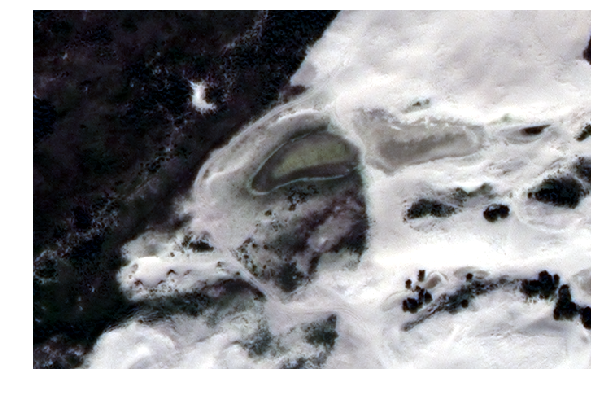

In [13]:
from gbdxtools.task import env
from gbdxtools import CatalogImage
%matplotlib inline

catalog_id = env.inputs.get('catalog_id', '103005001AF8F900')
bbox = env.inputs.get('bbox', '4.324804544448853, 52.140165354845685, 4.328999519348145, 52.14179172846516')

image = CatalogImage(catalog_id, band_type="MS", bbox=map(float, bbox.split(",")),proj=UTM_EPSG_code
                         ,pansharpen=True)
image.plot(w=10, h=10)



In [5]:
### get metadata

print("CatID: {} instantiated as a {} {}-band raster with {} rows and {} columns".format(catalog_id, image.dtype, *image.shape))
print("  with geographic bounds: ({})".format(bbox))
print("  in projection: {}".format(image.ipe_metadata["georef"]["spatialReferenceSystemCode"]))
print("  at {:0.2f} meter resolution".format(image.ipe_metadata["image"]["groundSampleDistanceMeters"]))
print("  and {:0.2f} degrees off nadir".format(image.ipe_metadata["image"]["offNadirAngle"]))
print("  taken on {}".format(image.ipe_metadata["image"]["acquisitionDate"]))

print '  shape', image.shape
print image.ipe.metadata['image']['sensorName']

CatID: 103005001AF8F900 instantiated as a float32 8-band raster with 1862 rows and 1485 columns
  with geographic bounds: (4.323592185974122, 52.13712315244718, 4.332561492919923, 52.14410278881428)
  in projection: EPSG:32631
  at 0.52 meter resolution
  and 18.90 degrees off nadir
  taken on 2012-05-27T11:12:07.577Z
  shape (8, 1862, 1485)
8-band (Coastal, Blue, Green, Yellow, Red, Red-edge, NIR1, NIR2) Multispectral


Fetching Image... 99 tiles


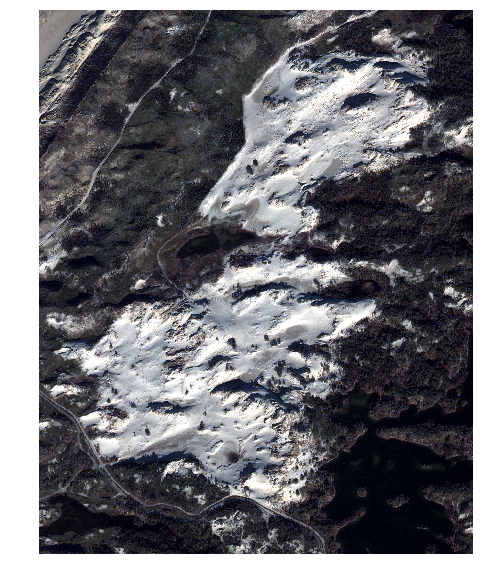

In [6]:
from gbdxtools.task import env
from gbdxtools import CatalogImage
%matplotlib inline

catalog_id = env.inputs.get('catalog_id', '1040050006DCE400')
bbox = env.inputs.get('bbox', '4.324804544448853, 52.140165354845685, 4.328999519348145, 52.14179172846516')

image = CatalogImage(catalog_id, band_type="MS", bbox=map(float, bbox.split(",")),proj=UTM_EPSG_code
                         ,pansharpen=True)
image.plot(w=10, h=10)

In [42]:
### get metadata

print("CatID: {} instantiated as a {} {}-band raster with {} rows and {} columns".format(catalog_id, image.dtype, *image.shape))
print("  with geographic bounds: ({})".format(bbox))
print("  in projection: {}".format(image.ipe_metadata["georef"]["spatialReferenceSystemCode"]))
print("  at {:0.2f} meter resolution".format(image.ipe_metadata["image"]["groundSampleDistanceMeters"]))
print("  and {:0.2f} degrees off nadir".format(image.ipe_metadata["image"]["offNadirAngle"]))
print("  taken on {}".format(image.ipe_metadata["image"]["acquisitionDate"]))

print '  shape', image.shape
print image.ipe.metadata['image']['sensorName']

CatID: 1040050006DCE400 instantiated as a float32 8-band raster with 3647 rows and 2835 columns
  with geographic bounds: (4.322261810302735, 52.13475246108585, 4.333763122558595, 52.1439447714136)
  in projection: EPSG:32631
  at 0.35 meter resolution
  and 21.70 degrees off nadir
  taken on 2018-02-14T11:15:29.505Z
  shape (8, 3647, 2835)
8-band (Coastal, Blue, Green, Yellow, Red, Red-edge, NIR1, NIR2) Multispectral


In [14]:
## do pixel based analysis
# Calculate the water index
water_index = (image[7,:,:] - image[0,:,:]) / (image[7,:,:] + image[0,:,:])

# Also extract the visible color (i.e., Red-Green-Blue) bands, which we'll use for side-by-side plotting as we proceed
rgb = image.rgb()

# calculate water index and ndvi

coastal = image[0,:,:].astype(np.float32)
red = image[4,:,:].astype(np.float32)
nir = image[6,:,:].astype(np.float32)
blue = image [1,:,:].astype(np.float32)
nir2 = image[7,:,:].astype(np.float32)

water_index = (nir2 - coastal)/(nir2 + coastal)

ndvi = np.clip((nir - red)/(nir + red), -1, 1)

EVI = 2.5 * ( nir - red ) / ( nir + 6.5 * red - 7.5 * blue+ 1.0 )

# set threshold values for water, tree, etc. 
A = ndvi >= 0.6
B = ndvi.all() >= 0.3 and ndvi.all() < 0.6
C = ndvi < 0.3
plants= A*2+B*3+C

# First, clean up any nan values
water_index[np.isnan(water_index)] = 0

# Next, run a gaussian smoothing kernel over the image. This will smooth out localized noise in the water index
# by use a focal moving window.
water_index_smoothed = filters.gaussian(water_index, preserve_range=True)

# Finally, we are going to run the thresholding. We are going to use a method called Otsu's method,
# which picks the threshold that will maximize the variance between the values on either side of it.
# For more info on Otsu's Method, see: 
# http://scikit-image.org/docs/dev/auto_examples/xx_applications/plot_thresholding.html
# and http://en.wikipedia.org/wiki/Otsu’s_method.


# Find the threshold
binary_threshold = -0.5 

# Apply the threshold
binary_water = water_index_smoothed >= binary_threshold
# Specify the minimum feature size in square meters, and then use info from the image metadata 
# to translate to grid cell count.

# Set the minimum feature size to 400 sq km (400,000 m)
min_feature_size_m2 = 40.

# From the image metadata, we can determine the area of a single grid cell
cell_height_m = image.ipe.metadata['image']['groundSampleDistanceMeters']
cell_area_m2 = cell_height_m**2

# Finally, use the cell size to convert the minimum feature size to grid cells
min_feature_size_cells = np.round((min_feature_size_m2/cell_area_m2)).astype('int64')

# First, remove the small holes
water_cleaned = morphology.remove_small_holes(binary_water, min_feature_size_cells)

# Then remove the small objects
water_cleaned = morphology.remove_small_objects(water_cleaned, min_feature_size_cells, connectivity=2)

# Combine all layers for easier analysis
all_layers = plants+water_cleaned*3

Fetching Image... 6 tiles


In [11]:
# plot one of the calculated rasters

def plot(image, cmap='jet'):
    f, ax = plt.subplots(1, figsize=(w,h))
    ax.axis('on')
    plt.imshow(image, cmap=cmap)
    plt.colorbar()
    plt.show()
    

fig, ax = plt.subplots(1,figsize=(50,50))
plt.imshow(rgb)#, vmin=-1, vmax=1,) # edit this to plot another raster
plt.colorbar()
fig.savefig('Images/Dunea_2012.png')
plt.close(fig)    # close the figure

plt.show()



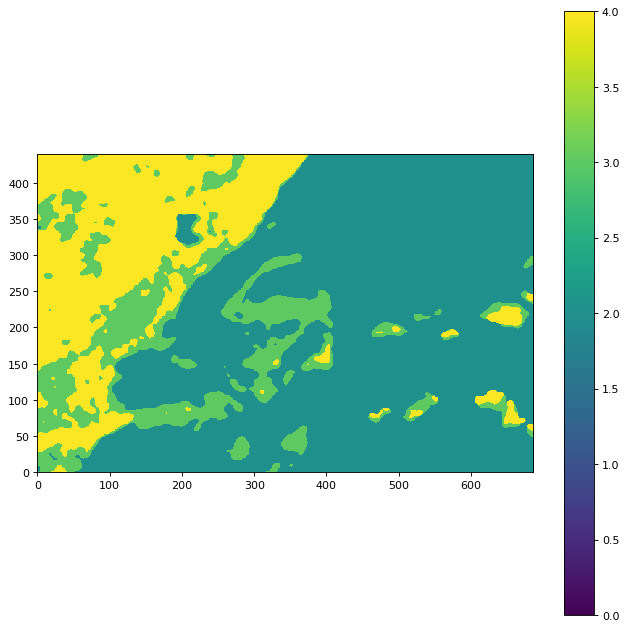

In [15]:
# calculate total cells for each class by masking and setting pixel values to 1

# create sequence of edited x and y coordinates, widht and heigth  for use in ImageDraw function
# polygon = [(x2[i], y2[i]) for i in range(len(x2))]
# width = all_layers.shape[1]
# height = all_layers.shape[0]


# convert polygon coordinates to raster/array values using ImageDraw
# img = Image.new('L', (width, height), 0)
# ImageDraw.Draw(img).polygon(polygon, fill=1)
# # convert image to array and set as mask
# mask = numpy.array(img)


import copy
# create boolean mask
mask = EVI



# copy layers for classification
EVI_test = copy.copy(EVI)
test_image = copy.copy(all_layers)

# flip image and EVI to allign with polygon based mask
EVI_test = np.flipud(EVI_test)
test_image = np.flipud(test_image)


# apply mask to test image 
test_image[mask == 0] = 0

# copy layers for total pixel count 
test_image_buildup = copy.copy(test_image)
test_image_water = copy.copy(test_image)
test_image_Green = copy.copy(test_image)
total_pixels = copy.copy(test_image)


# remove all pixel values that do not belong to class and set all other pixel values to 1
test_image_buildup[test_image_buildup != 4] = 0
test_image_water[test_image_water != 1] = 0



test_image_buildup[test_image_buildup == 4] = 1
test_image_water[test_image_water == 1] = 1

test_image_Green[test_image_Green == 3] = 5
test_image_Green[ test_image_Green != 5] = 0

test_image_Green[test_image_Green == 5] = 1

test_image_Trees = copy.copy(test_image_Green)
test_image_Grass = copy.copy(test_image_Green)

test_image_Trees[EVI_test > -.25] = 0
test_image_Grass[EVI_test < -.25] = 0

total_pixels[total_pixels > 0] = 1

# create final classification i
final_classification = test_image_water+(2*test_image_buildup)+(3*test_image_Grass)+(4*test_image_Trees)

plt.figure(num=None, figsize=(10, 10), dpi=80, facecolor='w', edgecolor='k')
plt.imshow(final_classification, vmin=0, vmax=4)
# plt.imshow(test_image_Trees, vmin=-1, vmax=1)
plt.colorbar()
plt.gca().invert_yaxis()


In [16]:
# calculate percentage of pixels covered per class

percentage_trees  = round((float(sum(sum(test_image_Trees)))/float(sum(sum(total_pixels))))*100,1)
percentage_buildup  = round(float(sum(sum(test_image_buildup)))/float(sum(sum(total_pixels)))*100,1)
percentage_water  = round(float(sum(sum(test_image_water)))/float(sum(sum(total_pixels)))*100,1)
percentage_grass  = round(float(sum(sum(test_image_Grass)))/float(sum(sum(total_pixels)))*100,1)


# print results
print 'Total pixels            ', sum(sum(total_pixels))
print 'Total tree pixels       ', sum(sum(test_image_Trees)),' which is ', percentage_trees, '%'
print 'Total grass pixels      ', sum(sum(test_image_Grass)),' which is ', percentage_grass, '%'
print 'Total impervious pixels ', sum(sum(test_image_buildup)),' which is  ', percentage_buildup, '%'
print 'Total water pixels      ', sum(sum(test_image_water)),' which is  ', percentage_water, '%'

print percentage_trees + percentage_buildup + percentage_water + percentage_grass

Total pixels             302526
Total tree pixels        66955  which is  22.1 %
Total grass pixels       45770  which is  15.1 %
Total impervious pixels  189801  which is   62.7 %
Total water pixels       0  which is   0.0 %
99.9


In [109]:
from shapely.geometry import box, shape
from gbdxtools import Interface
from collections import namedtuple
import pandas as pd


gbdx = Interface()

COORDS = [4.324804544448853, 52.140165354845685, 4.328999519348145, 52.14179172846516]

# convert bounding box to well known format usable by GBDX tools
bbox_wkt = box(*[4.324804544448853, 52.140165354845685, 4.328999519348145, 52.14179172846516]).wkt
aoi = bbox_wkt

# query images that cover the park
query = "(item_type:WV03_VNIR OR WV02)"
query += " AND NOT item_type:IDAHOImage AND item_type:DigitalGlobeProduct"   
results = gbdx.vectors.query(aoi, query)

# calculate the overlap between image and park

Rectangle = namedtuple('Rectangle', 'xmin ymin xmax ymax')

ra = Rectangle(4.324804544448853, 52.140165354845685, 4.328999519348145, 52.14179172846516) # set wgs park area in rectangle

# function for calculating overlap 
def area_overlap(a, b):  # returns None if rectangles don't intersect
    dx = min(a.xmax, b.xmax) - max(a.xmin, b.xmin)
    dy = min(a.ymax, b.ymax) - max(a.ymin, b.ymin)
    if (dx>=0) and (dy>=0):
        return dx*dy




# create dataframe for image metadata
images_df = pd.DataFrame(columns=['id','month','year','type','resolution','cloud cover','overlap','check'])

# loop over all found images and load metadata in dataframe
# also perform a test to find the right images
for r in results:
    props = r['properties']
    geom = r['geometry']
    
    coordinates_image = geom['coordinates'][0][0]
    df_overlap = pd.DataFrame.from_records(coordinates_image,columns = ['x','y'])
    
    rb = Rectangle(df_overlap.x.min(), df_overlap.y.min(), df_overlap.x.max(), df_overlap.y.max())
    
    total_area = ((ra.xmax-ra.xmin)*(ra.ymax-ra.ymin))
    
    total_overlap = area_overlap(ra, rb)
    
    if total_overlap is None:
        fraction_overlap = 0
    else:
        fraction_overlap = area_overlap(ra, rb)/total_area
    
    
    images_df = images_df.append({'id': props['attributes']['catalogID'],'month':props['item_date'][5:7],'year':props['item_date'][0:4],
                   'type':props['item_type'][1],'resolution':props['attributes']['resolution_dbl'],
                   'cloud cover':props['attributes']['cloudCover_int'],'overlap': fraction_overlap,
                    # perform check on, cloud cover, month (summer), and overlap 
                    'check':props['attributes']['cloudCover_int'] < 20 and 
                   fraction_overlap >.9},ignore_index=True)


# select only the images that survive the test
selection = images_df.loc[images_df.check == True].reset_index()

# group by image id because 
selection = selection.groupby(['id'],sort=['year','month'],as_index=False).first().sort_values(['year','month'], ascending=True).reset_index()


# print selection
selection

,level_0,id,index,month,year,type,resolution,cloud cover,overlap,check
0,5,103005001AF8F900,38,05,2012,WV02,2.062,0,1.0,True
1,6,103005001AF8FA00,40,05,2012,WV02,1.961,0,1.0,True
2,7,1030050027F94500,23,12,2013,WV02,1.932,0,1.0,True
3,8,1030050027F94600,12,12,2013,WV02,1.955,0,1.0,True
4,0,103001002C4ADD00,21,02,2014,WV02,2.119,0,1.0,True
5,1,103001002D78B600,17,02,2014,WV02,2.369,17,1.0,True
6,9,1030050030F8F200,19,07,2014,WV02,2.285,0,1.0,True
7,10,1040010014CF2A00,4,11,2015,WV03_VNIR,1.472,9,1.0,True
8,2,103001005DC15B00,29,10,2016,WV02,2.053,14,1.0,True
9,3,103001005F3A8100,16,11,2016,WV02,0.580,0,1.0,True


In [41]:
selection.year[1]

u'2016'

Fetching Image... 1 tile
Fetching Image... 1 tile
Fetching Image... 1 tile


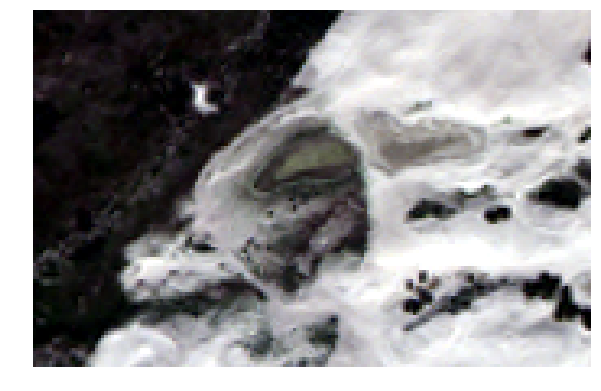

Fetching Image... 1 tile
2012-05-27T11:12:08.512Z
Fetching Image... 1 tile
Fetching Image... 1 tile
Fetching Image... 1 tile
Fetching Image... 1 tile


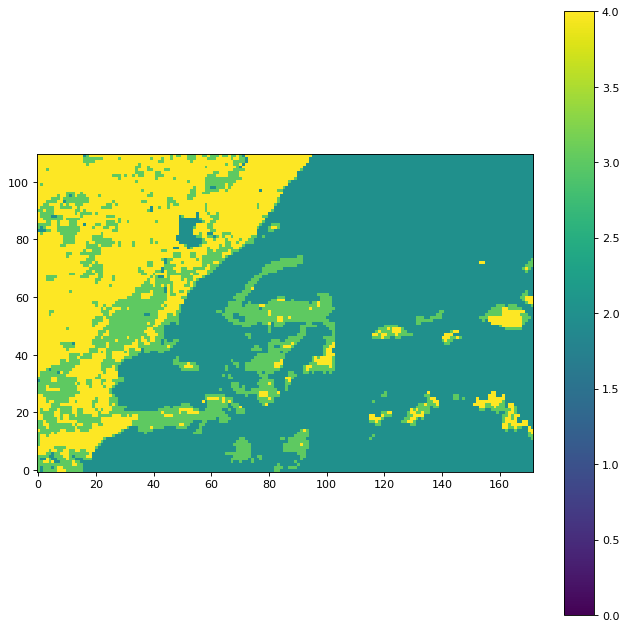

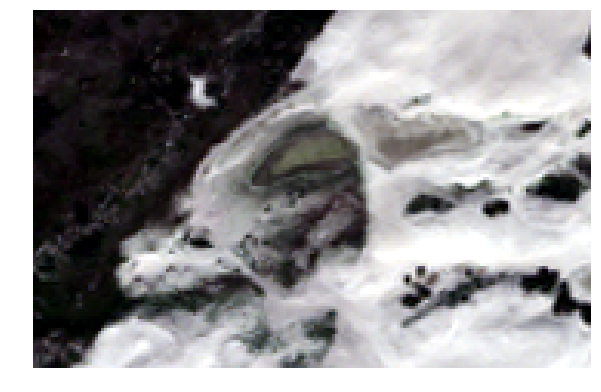

Fetching Image... 1 tile
2012-05-27T11:12:20.875Z
Fetching Image... 1 tile
Fetching Image... 1 tile
Fetching Image... 1 tile
Fetching Image... 1 tile


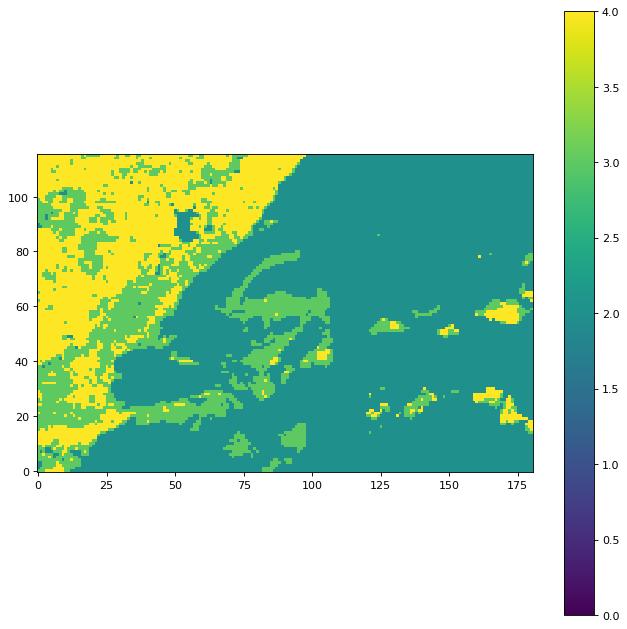

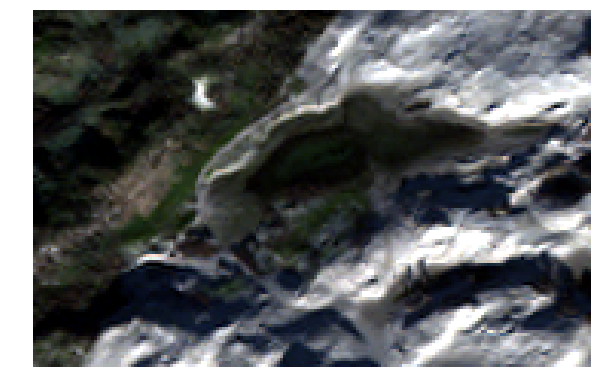

Fetching Image... 1 tile
2013-12-10T11:05:27.672Z
Fetching Image... 1 tile
Fetching Image... 1 tile
Fetching Image... 1 tile
Fetching Image... 1 tile


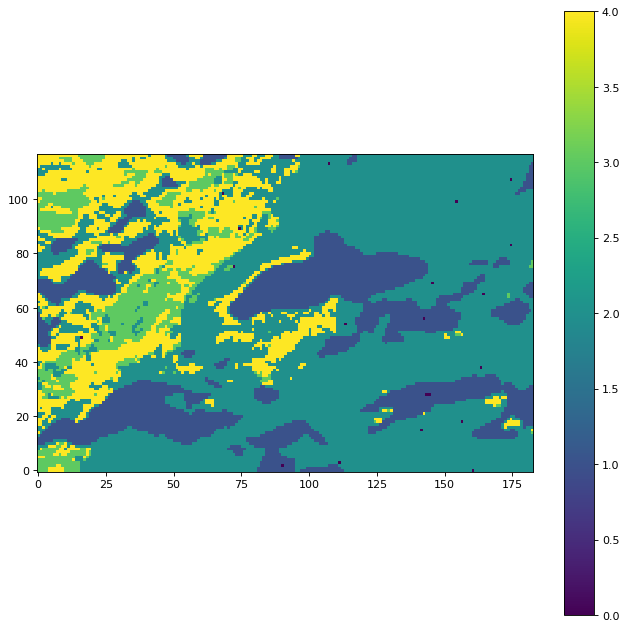

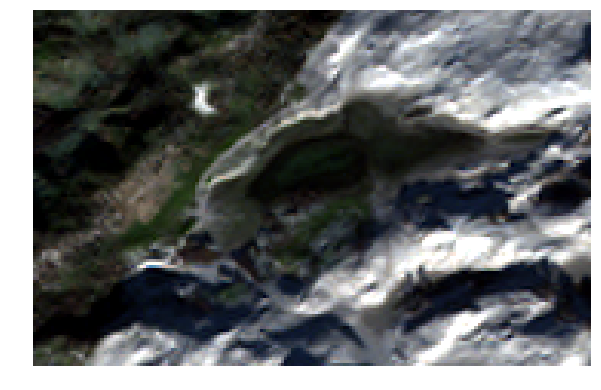

Fetching Image... 1 tile
2013-12-10T11:05:38.293Z
Fetching Image... 1 tile
Fetching Image... 1 tile
Fetching Image... 1 tile
Fetching Image... 1 tile


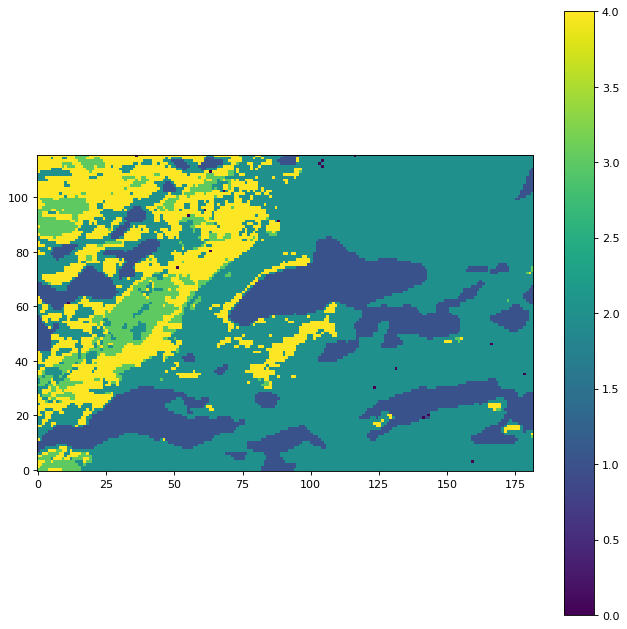

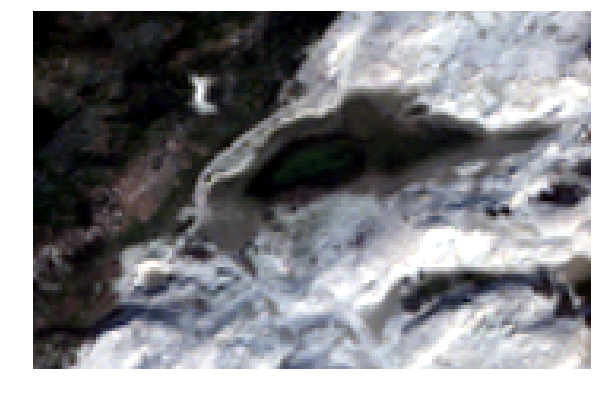

Fetching Image... 1 tile
2014-02-24T11:07:11.997Z
Fetching Image... 1 tile
Fetching Image... 1 tile
Fetching Image... 1 tile
Fetching Image... 1 tile


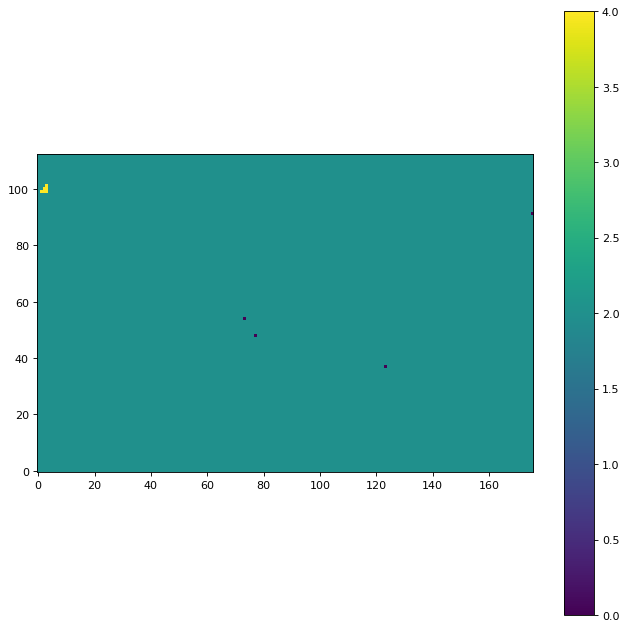

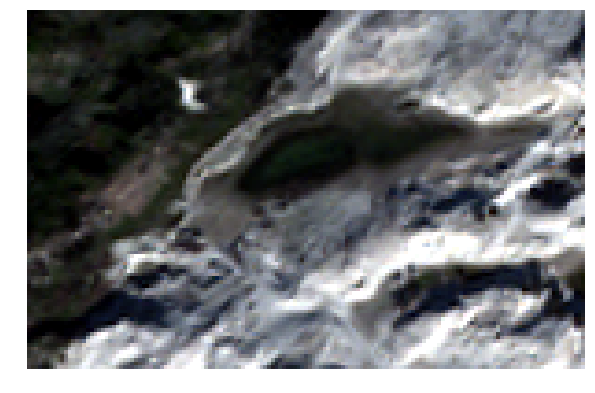

Fetching Image... 1 tile
2014-02-16T11:00:12.619Z
Fetching Image... 1 tile
Fetching Image... 1 tile
Fetching Image... 1 tile
Fetching Image... 1 tile


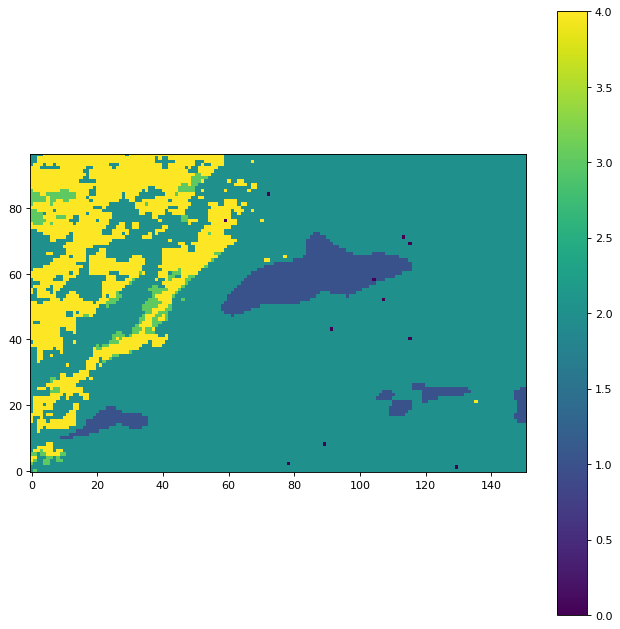

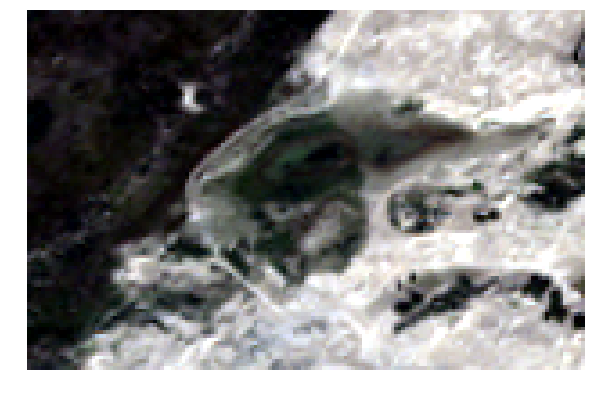

Fetching Image... 1 tile
2014-07-10T10:52:02.122Z
Fetching Image... 1 tile
Fetching Image... 1 tile
Fetching Image... 1 tile
Fetching Image... 1 tile


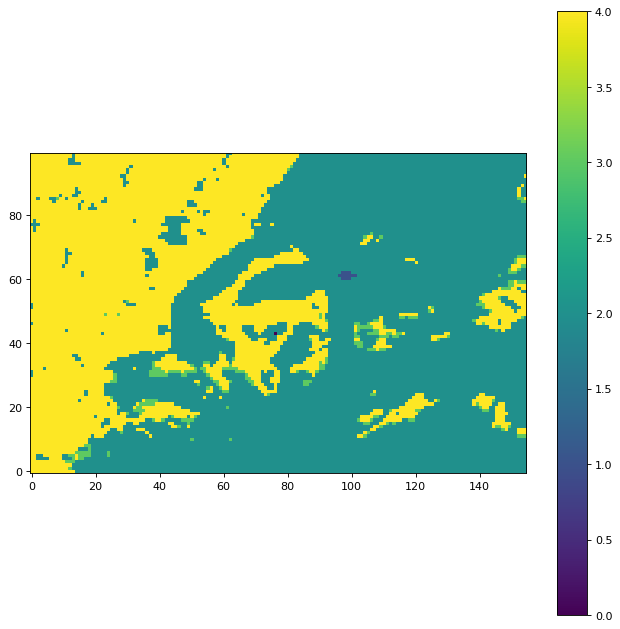

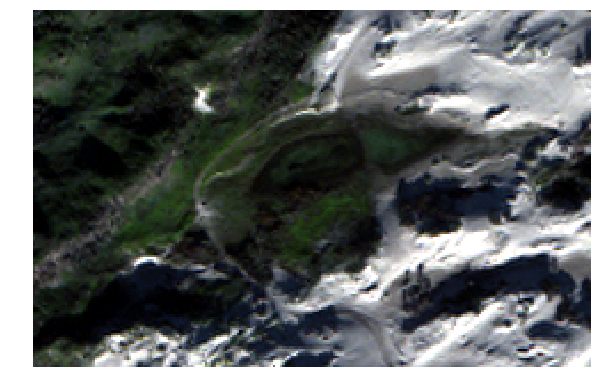

Fetching Image... 1 tile
2015-11-26T11:17:46.551Z
Fetching Image... 1 tile
Fetching Image... 1 tile
Fetching Image... 1 tile
Fetching Image... 1 tile


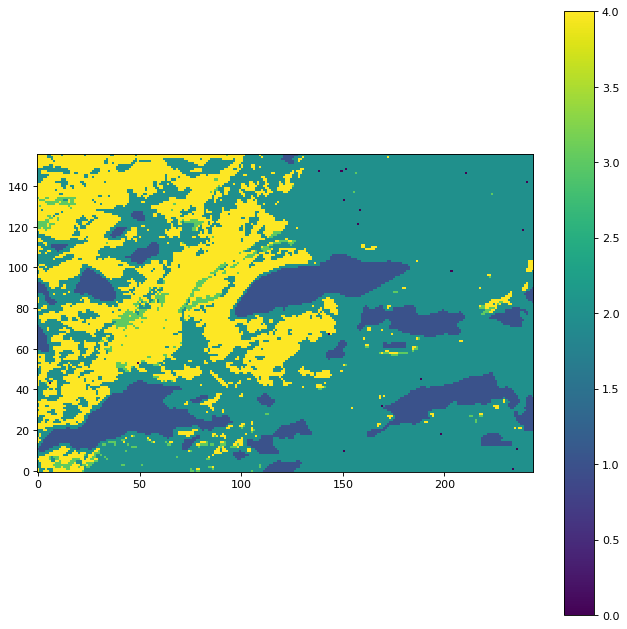

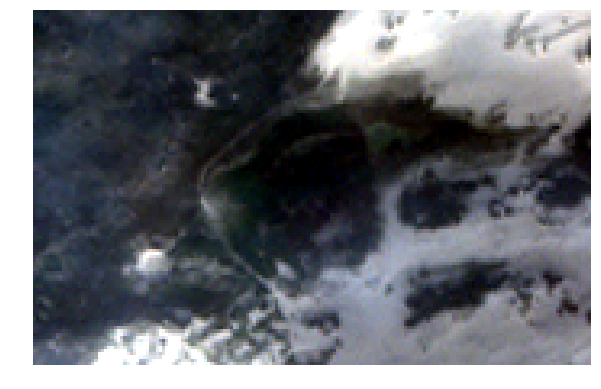

Fetching Image... 1 tile
2016-10-08T10:59:33.991Z
Fetching Image... 1 tile
Fetching Image... 1 tile
Fetching Image... 1 tile
Fetching Image... 1 tile


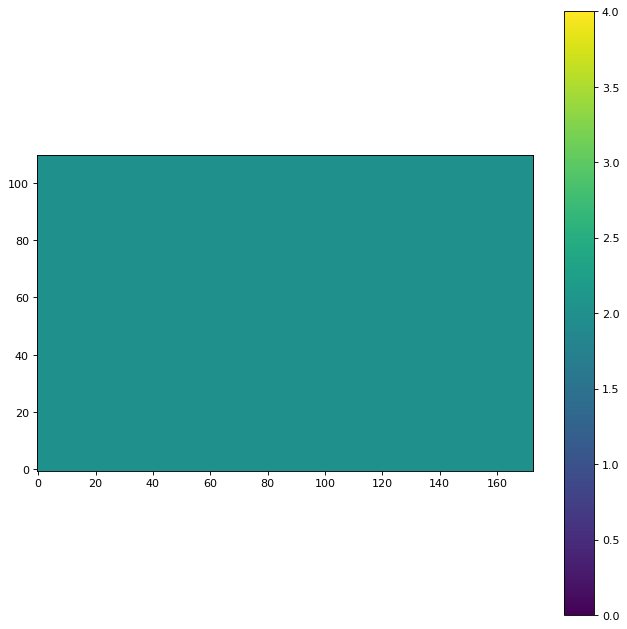

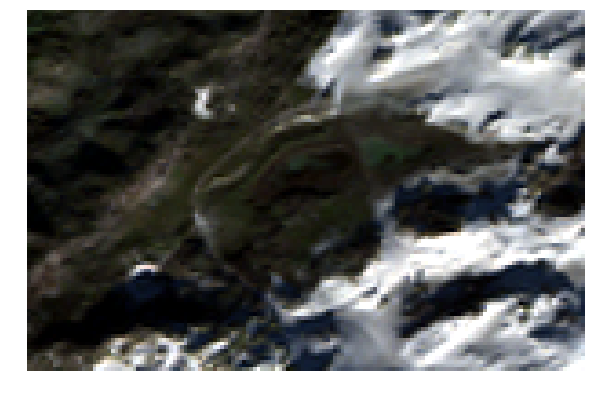

Fetching Image... 1 tile
2016-11-28T11:18:11.500Z
Fetching Image... 1 tile
Fetching Image... 1 tile
Fetching Image... 1 tile
Fetching Image... 1 tile


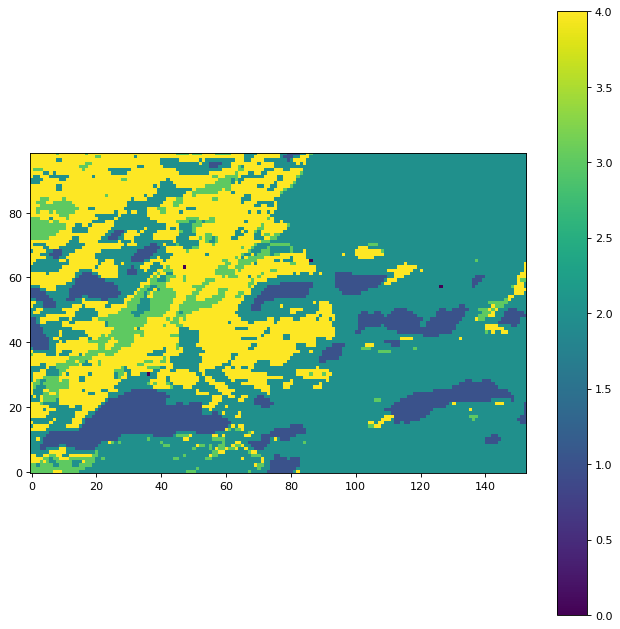

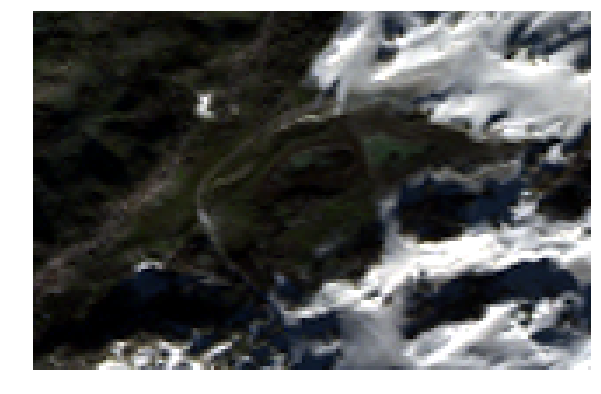

Fetching Image... 1 tile
2016-11-28T11:17:02.611Z
Fetching Image... 1 tile
Fetching Image... 1 tile
Fetching Image... 1 tile
Fetching Image... 1 tile


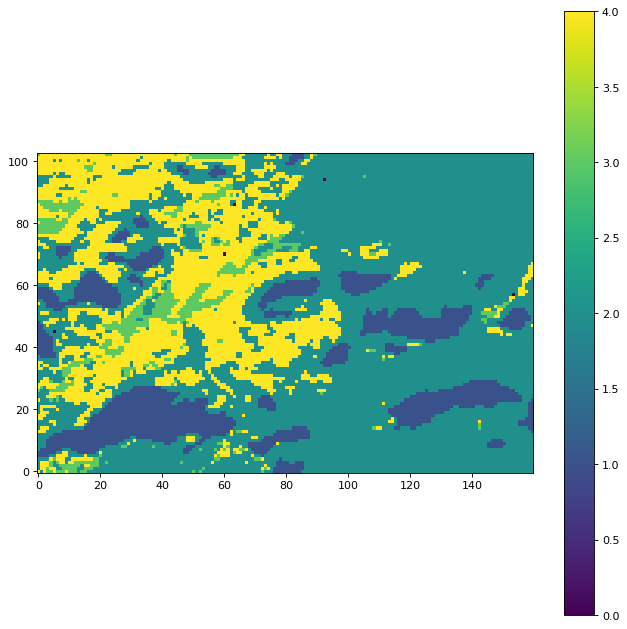

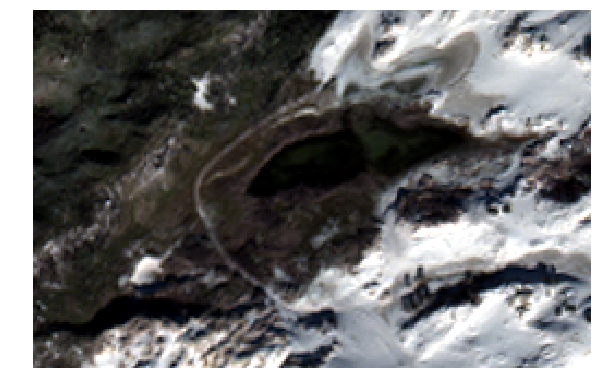

Fetching Image... 1 tile
2018-02-14T11:15:33.186Z
Fetching Image... 1 tile


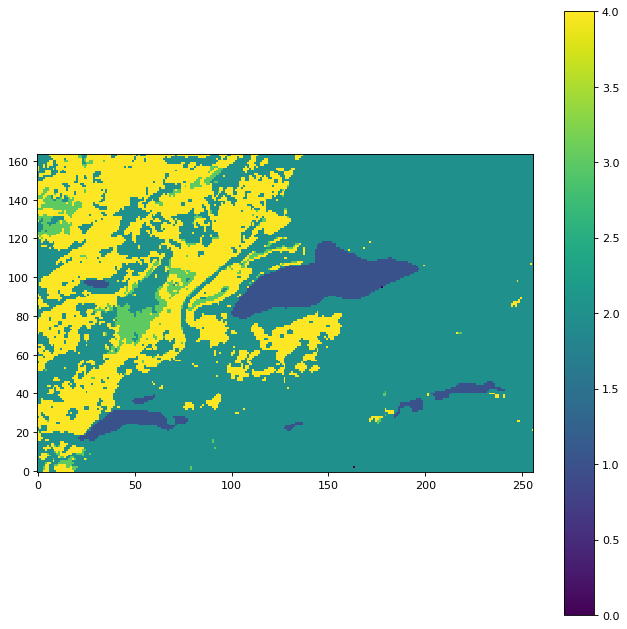

In [142]:

results_df = pd.DataFrame(columns=['id','month','year','type','resolution','Grass','Trees','Water','Impervious'])


# set park bounding box 
bbox = env.inputs.get('bbox', aoi)

# i = 2
for i in range(len(selection)):

    # set catalog id from selection
    catalog_id = env.inputs.get('catalog_id', selection.id[i])
    
    bbox = env.inputs.get('bbox', '4.324804544448853, 52.140165354845685, 4.328999519348145, 52.14179172846516')

    # collect image
    image = CatalogImage(catalog_id, band_type="MS", bbox=map(float, bbox.split(",")),proj=UTM_EPSG_code
                         ,pansharpen=True)


    # calculate mean of coastal band to see if image is defective (some images show only black)
    mean_coastal = image[1,:,:].read().mean() 

    defective_check = image[1,:,:].read()

    # use image if not defective, otherwise 
    if min(defective_check[1]) != 0 :

        

        
        image.plot(w=10, h=10)
        
        rgb = image.rgb()
        
        fig, ax = plt.subplots(1,figsize=(50,50))
        plt.imshow(rgb)#, vmin=-1, vmax=1,) # edit this to plot another raster
        fig.savefig('Images/Dunea_{0}.png'.format(image.ipe_metadata["image"]["acquisitionDate"]))
        plt.close(fig)    # close the figure
        print image.ipe_metadata["image"]["acquisitionDate"]
        # DO THE ANALYSIS HERE 

    else:

        print 'image defective' 
        # move to next without doing analysis


    ## do pixel based analysis
    # Calculate the water index
    water_index = (image[7,:,:] - image[0,:,:]) / (image[7,:,:] + image[0,:,:])

    # Also extract the visible color (i.e., Red-Green-Blue) bands, which we'll use for side-by-side plotting as we proceed
    rgb = image.rgb()

    # calculate water index and ndvi

    coastal = image[0,:,:].astype(np.float32)
    red = image[4,:,:].astype(np.float32)
    nir = image[6,:,:].astype(np.float32)
    blue = image [1,:,:].astype(np.float32)
    nir2 = image[7,:,:].astype(np.float32)

    water_index = (nir2 - coastal)/(nir2 + coastal)

    ndvi = np.clip((nir - red)/(nir + red), -1, 1)

    EVI = 2.5 * ( nir - red ) / ( nir + 6.5 * red - 7.5 * blue+ 1.0 )

    # set threshold values for water, tree, etc. 
    A = ndvi >= 0.6
    B = ndvi.all() >= 0.3 and ndvi.all() < 0.6
    C = ndvi < 0.3
    plants= A*2+B*3+C

    # First, clean up any nan values
    water_index[np.isnan(water_index)] = 0

    # Next, run a gaussian smoothing kernel over the image. This will smooth out localized noise in the water index
    # by use a focal moving window.
    water_index_smoothed = filters.gaussian(water_index, preserve_range=True)

    # Finally, we are going to run the thresholding. We are going to use a method called Otsu's method,
    # which picks the threshold that will maximize the variance between the values on either side of it.
    # For more info on Otsu's Method, see: 
    # http://scikit-image.org/docs/dev/auto_examples/xx_applications/plot_thresholding.html
    # and http://en.wikipedia.org/wiki/Otsu’s_method.


    # Find the threshold
    binary_threshold = -0.5 

    # Apply the threshold
    binary_water = water_index_smoothed >= binary_threshold
    # Specify the minimum feature size in square meters, and then use info from the image metadata 
    # to translate to grid cell count.

    # Set the minimum feature size to 400 sq km (400,000 m)
    min_feature_size_m2 = 40.

    # From the image metadata, we can determine the area of a single grid cell
    cell_height_m = image.ipe.metadata['image']['groundSampleDistanceMeters']
    cell_area_m2 = cell_height_m**2

    # Finally, use the cell size to convert the minimum feature size to grid cells
    min_feature_size_cells = np.round((min_feature_size_m2/cell_area_m2)).astype('int64')

    # First, remove the small holes
    water_cleaned = morphology.remove_small_holes(binary_water, min_feature_size_cells)

    # Then remove the small objects
    water_cleaned = morphology.remove_small_objects(water_cleaned, min_feature_size_cells, connectivity=2)

    # Combine all layers for easier analysis
    all_layers = plants+water_cleaned*3


    # calculate total cells for each class by masking and setting pixel values to 1

    # create sequence of edited x and y coordinates, widht and heigth  for use in ImageDraw function
    # polygon = [(x2[i], y2[i]) for i in range(len(x2))]
    # width = all_layers.shape[1]
    # height = all_layers.shape[0]


    # convert polygon coordinates to raster/array values using ImageDraw
    # img = Image.new('L', (width, height), 0)
    # ImageDraw.Draw(img).polygon(polygon, fill=1)
    # # convert image to array and set as mask
    # mask = numpy.array(img)


    import copy
    # create boolean mask
    mask = EVI



    # copy layers for classification
    EVI_test = copy.copy(EVI)
    test_image = copy.copy(all_layers)

    # flip image and EVI to allign with polygon based mask
    EVI_test = np.flipud(EVI_test)
    test_image = np.flipud(test_image)


    # apply mask to test image 
    test_image[mask == 0] = 0

    # copy layers for total pixel count 
    test_image_buildup = copy.copy(test_image)
    test_image_water = copy.copy(test_image)
    test_image_Green = copy.copy(test_image)
    total_pixels = copy.copy(test_image)


    # remove all pixel values that do not belong to class and set all other pixel values to 1
    test_image_buildup[test_image_buildup != 4] = 0
    test_image_water[test_image_water != 1] = 0



    test_image_buildup[test_image_buildup == 4] = 1
    test_image_water[test_image_water == 1] = 1

    test_image_Green[test_image_Green == 3] = 5
    test_image_Green[ test_image_Green != 5] = 0

    test_image_Green[test_image_Green == 5] = 1

    test_image_Trees = copy.copy(test_image_Green)
    test_image_Grass = copy.copy(test_image_Green)

    test_image_Trees[EVI_test > -.25] = 0
    test_image_Grass[EVI_test < -.25] = 0

    total_pixels[total_pixels > 0] = 1

    # create final classification i
    final_classification = test_image_water+(2*test_image_buildup)+(3*test_image_Grass)+(4*test_image_Trees)

    plt.figure(num=None, figsize=(10, 10), dpi=80, facecolor='w', edgecolor='k')
    plt.imshow(final_classification, vmin=0, vmax=4)
    # plt.imshow(test_image_Trees, vmin=-1, vmax=1)
    plt.colorbar()
    plt.gca().invert_yaxis()


    percentage_trees  = round((float(sum(sum(test_image_Trees)))/float(sum(sum(total_pixels))))*100,1)
    percentage_buildup  = round(float(sum(sum(test_image_buildup)))/float(sum(sum(total_pixels)))*100,1)
    percentage_water  = round(float(sum(sum(test_image_water)))/float(sum(sum(total_pixels)))*100,1)
    percentage_grass  = round(float(sum(sum(test_image_Grass)))/float(sum(sum(total_pixels)))*100,1)
    
    
    results_df = results_df.append({'id': selection.id[i],
                                    'month':selection.month[i],
                                    'year':selection.year[i],
                                    'type':selection.type[i],
                                    'resolution':selection.resolution[i],
                                    'Grass':percentage_grass,
                                    'Trees':percentage_trees,
                                    'Water':percentage_water,
                                    'Impervious':percentage_buildup},
                                    ignore_index=True)
    
    



In [116]:
results_df = results_df[results_df.Trees > 0.5]
results_df

,id,month,year,type,resolution,Grass,Trees,Water,Impervious
0,103005001AF8F900,05,2012,WV02,2.062,14.9,22.8,0.0,62.2
1,103005001AF8FA00,05,2012,WV02,1.961,17.0,19.5,0.0,63.5
2,1030050027F94500,12,2013,WV02,1.932,6.7,16.1,20.6,56.6
3,1030050027F94600,12,2013,WV02,1.955,5.5,15.8,20.0,58.7
5,103001002D78B600,02,2014,WV02,2.369,1.6,14.2,6.1,78.0
6,1030050030F8F200,07,2014,WV02,2.285,1.8,36.5,0.1,61.6
7,1040010014CF2A00,11,2015,WV03_VNIR,1.472,1.7,24.0,13.5,60.8
9,103001005F3A8100,11,2016,WV02,0.580,6.0,25.8,10.3,57.8
10,103001006076BF00,11,2016,WV02,0.563,4.4,23.5,13.4,58.8
11,1040050006DCE400,02,2018,WV03_VNIR,1.472,2.7,21.8,5.8,69.7


In [117]:
results_df["datetime"] = results_df["year"].map(str) + '-' + results_df["month"]
results_df.datetime = pd.to_datetime(results_df.datetime, format="%Y-%m")

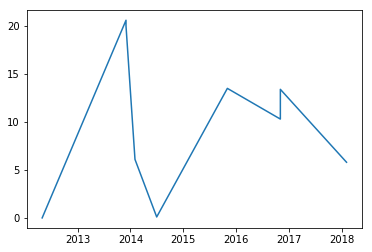

In [118]:
plt.plot(results_df["datetime"],results_df.Water)

In [120]:
from shapely.geometry import box
from gbdxtools import CatalogImage

bbox = box(4.324804544448853, 52.140165354845685, 4.328999519348145, 52.14179172846516).bounds

images = []
for i in results_df.id:
    try:
        images.append(CatalogImage(i, bbox=bbox,proj=UTM_EPSG_code,pansharpen=True))
    except Exception as err:
        print 'Couldnt create image for id: {}'.format(i), err


In [121]:
from IPython.display import HTML, display, Image
from tempfile import NamedTemporaryFile
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from skimage.transform import resize as imresize
%matplotlib inline

def create_movie(frames, text=None, fps=5, width=5, height=5, align=True, alphas=None):
    if text is None:
        text = ['' for s in range(len(frames))]
    ref_shape = frames[0].shape
    fig = plt.figure()
    ax = fig.add_subplot(111)
    ax.set_aspect('equal')
    ax.axis('off')
    
    im = ax.imshow(frames[0])
    _text = ax.text(20, 100, text[0], fontsize=30, color='red')
    im.set_clim([0,1])
    fig.set_size_inches([width,height])
    plt.tight_layout()
    
    VIDEO_TAG = """<video controls>
      <source src="data:video/x-m4v;base64,{0}" type="video/mp4">
      Your browser does not support the video tag.
    </video>"""
    
    def anim_to_html(anim, fps=5):
        if not hasattr(anim, '_encoded_video'):
            with NamedTemporaryFile(suffix='.mp4') as f:
                anim.save(f.name, fps=fps, extra_args=['-vcodec', 'libx264'])
                video = open(f.name, "rb").read()
            anim._encoded_video = video.encode("base64")

        return VIDEO_TAG.format(anim._encoded_video)
  
    def update_img(n):
        frame = imresize(frames[n], ref_shape, order=3)
        _text.set_text(text[n])
        im.set_data(frame)
        return im

    mov = animation.FuncAnimation(fig, update_img, len(frames), interval=30, repeat=True)
    plt.close(mov._fig)
    return display(HTML(anim_to_html(mov, fps=fps)))

In [122]:
rgbs = [img.rgb() for img in images]

Fetching Image... 6 tiles
Fetching Image... 6 tiles
Fetching Image... 6 tiles
Fetching Image... 6 tiles
Fetching Image... 6 tiles
Fetching Image... 6 tiles
Fetching Image... 12 tiles
Fetching Image... 6 tiles
Fetching Image... 6 tiles
Fetching Image... 12 tiles


In [141]:
dates = [v[:10] for k,v in results_df.year.items()]
create_movie(rgbs, text=dates, fps=1, width=20, height=14)

In [140]:
results_df.datetime[1].strftime('%m - %Y')

'05 - 2012'

0     05 - 2012
1     05 - 2012
2     12 - 2013
3     12 - 2013
5     02 - 2014
6     07 - 2014
7     11 - 2015
9     11 - 2016
10    11 - 2016
11    02 - 2018
dtype: object

Fetching Image... 9 tiles
Fetching Image... 9 tiles
Fetching Image... 6 tiles


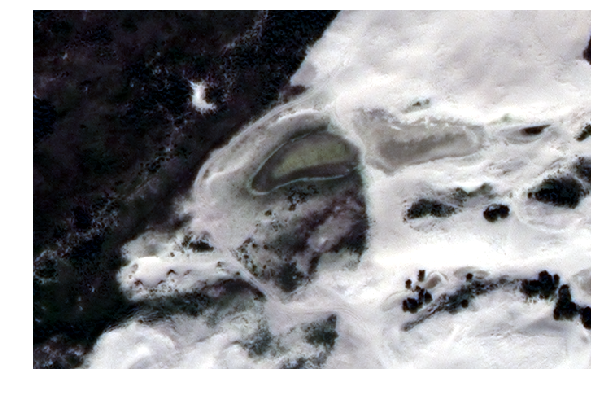

Fetching Image... 6 tiles
2012-05-27T11:12:07.577Z
Fetching Image... 9 tiles
Fetching Image... 9 tiles
Fetching Image... 6 tiles


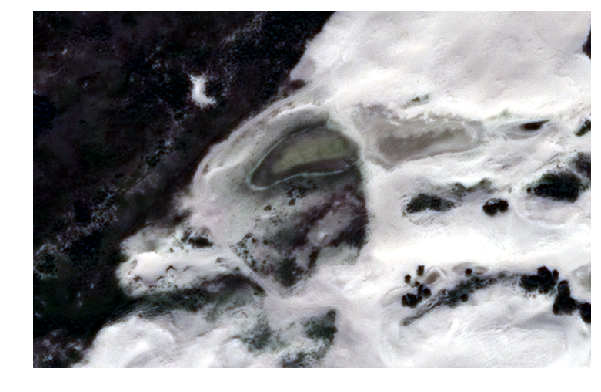

Fetching Image... 6 tiles
2012-05-27T11:12:20.875Z
Fetching Image... 9 tiles
Fetching Image... 9 tiles
Fetching Image... 6 tiles


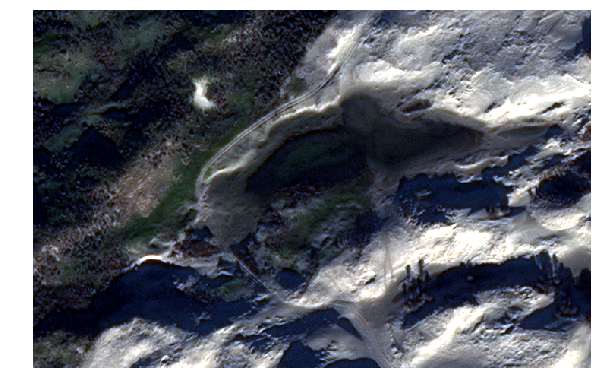

Fetching Image... 6 tiles
2013-12-10T11:05:28.853Z
Fetching Image... 9 tiles
Fetching Image... 9 tiles
Fetching Image... 6 tiles


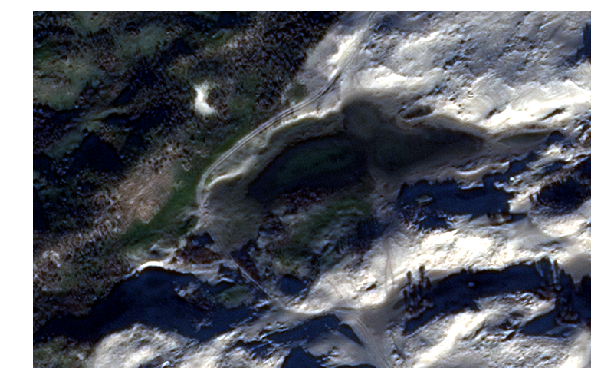

Fetching Image... 6 tiles
2013-12-10T11:05:38.293Z
Fetching Image... 9 tiles
Fetching Image... 9 tiles
Fetching Image... 6 tiles


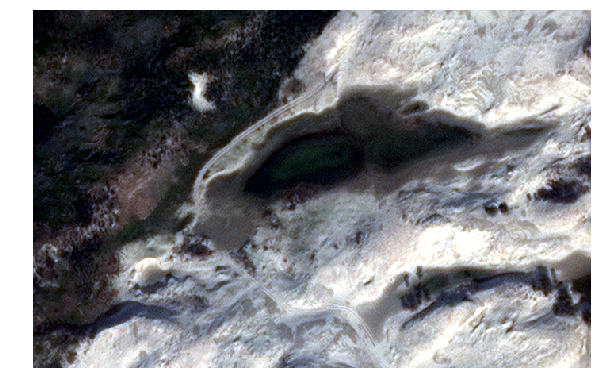

Fetching Image... 6 tiles
2014-02-24T11:07:08.128Z
Fetching Image... 9 tiles
Fetching Image... 9 tiles
Fetching Image... 6 tiles


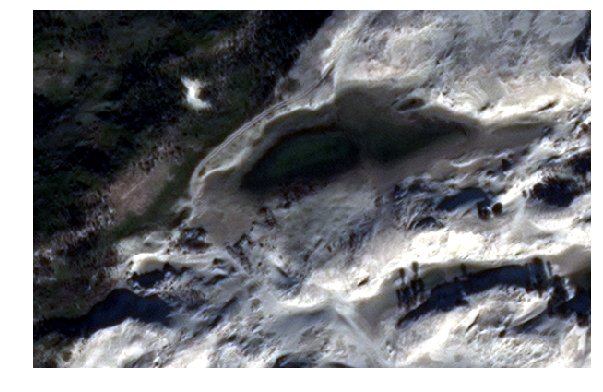

Fetching Image... 6 tiles
2014-02-16T11:00:10.699Z
Fetching Image... 9 tiles
Fetching Image... 9 tiles
Fetching Image... 6 tiles


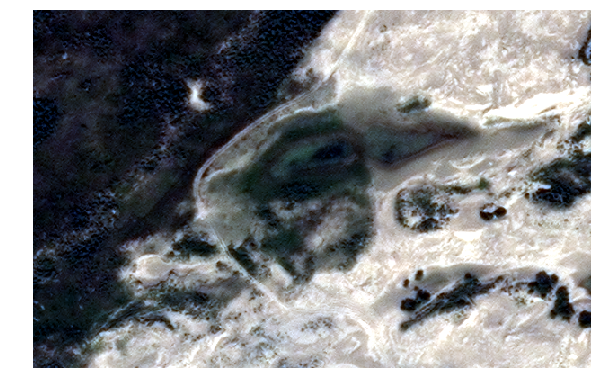

Fetching Image... 6 tiles
2014-07-10T10:52:02.123Z
Fetching Image... 16 tiles
Fetching Image... 16 tiles
Fetching Image... 12 tiles


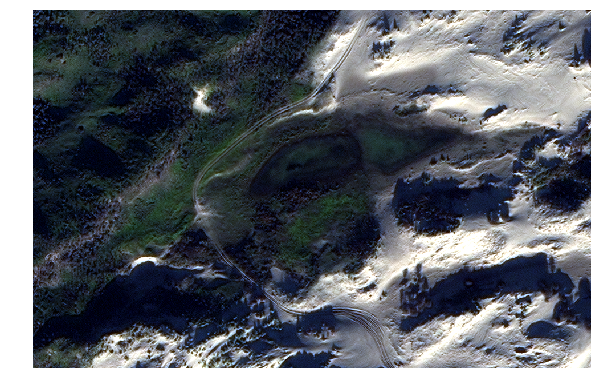

Fetching Image... 12 tiles
2015-11-26T11:17:45.019Z
Fetching Image... 9 tiles
Fetching Image... 9 tiles
Fetching Image... 6 tiles


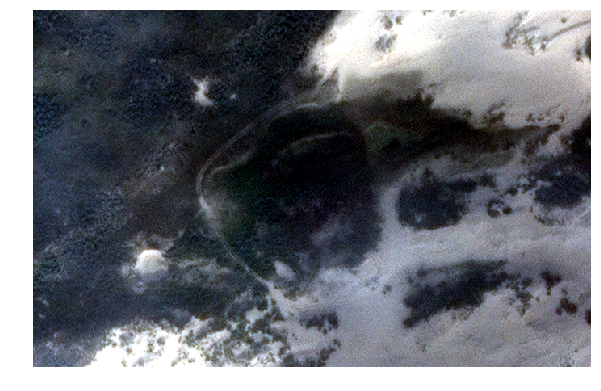

Fetching Image... 6 tiles
2016-10-08T10:59:33.991Z
Fetching Image... 9 tiles
Fetching Image... 9 tiles
Fetching Image... 6 tiles


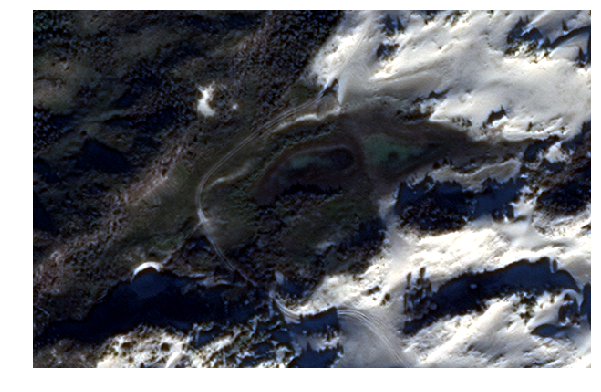

Fetching Image... 6 tiles
2016-11-28T11:18:12.534Z
Fetching Image... 9 tiles
Fetching Image... 9 tiles
Fetching Image... 6 tiles


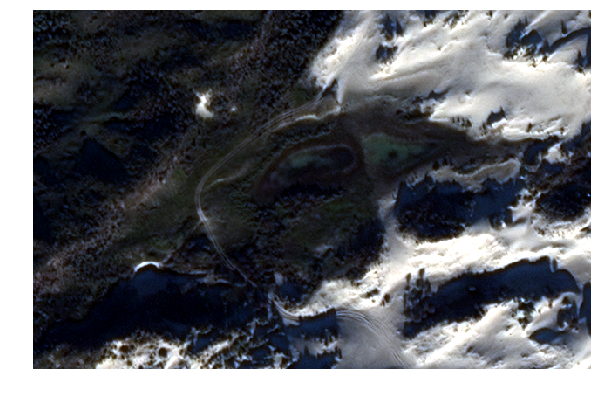

Fetching Image... 6 tiles
2016-11-28T11:17:01.613Z
Fetching Image... 16 tiles
Fetching Image... 16 tiles
Fetching Image... 12 tiles


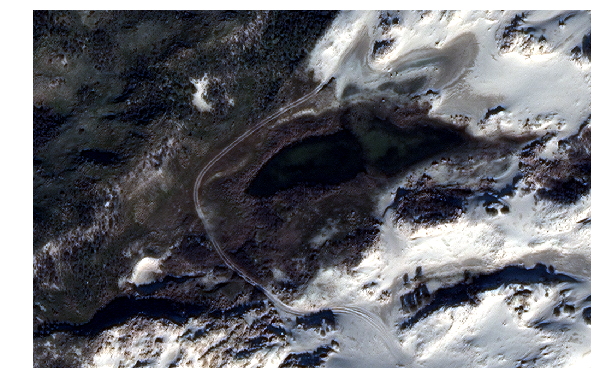

Fetching Image... 12 tiles
2018-02-14T11:15:29.505Z


In [143]:

results_df = pd.DataFrame(columns=['id','month','year','type','resolution','Grass','Trees','Water','Impervious'])


# set park bounding box 
bbox = env.inputs.get('bbox', aoi)

# i = 2
for i in range(len(selection)):

    # set catalog id from selection
    catalog_id = env.inputs.get('catalog_id', selection.id[i])
    
    bbox = env.inputs.get('bbox', '4.324804544448853, 52.140165354845685, 4.328999519348145, 52.14179172846516')

    # collect image
    image = CatalogImage(catalog_id, band_type="MS", bbox=map(float, bbox.split(",")),proj=UTM_EPSG_code
                         ,pansharpen=True)


    # calculate mean of coastal band to see if image is defective (some images show only black)
    mean_coastal = image[1,:,:].read().mean() 

    defective_check = image[1,:,:].read()

    # use image if not defective, otherwise 
    if min(defective_check[1]) != 0 :

        

        
        image.plot(w=10, h=10)
        
        rgb = image.rgb()
        
        fig, ax = plt.subplots(1,figsize=(50,50))
        plt.imshow(rgb)#, vmin=-1, vmax=1,) # edit this to plot another raster
        fig.savefig('Images/Dunea_{0}.png'.format(image.ipe_metadata["image"]["acquisitionDate"]))
        plt.close(fig)    # close the figure
        print image.ipe_metadata["image"]["acquisitionDate"]
        # DO THE ANALYSIS HERE 

    else:

        print 'image defective' 
        # move to next without doing analysis
